<a href="https://colab.research.google.com/github/denuradhan/PCVK_Advance/blob/main/Week5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Gamma Correction pada citra
------------------------------
Masukkan Nilai Gamma: 3


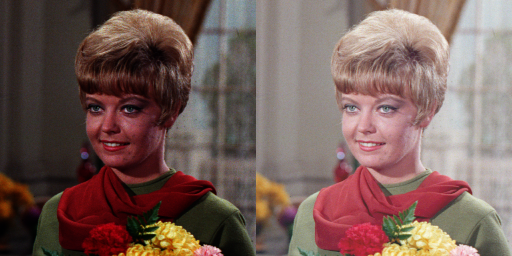

In [2]:
#Nomer 1
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
import matplotlib.pyplot as plt
import numpy as np
import glob as glob

print('Gamma Correction pada citra')
print('------------------------------')
try:
  gamma = int(input('Masukkan Nilai Gamma: '))
except ValueError:
  print('Error, not a number')

image_path = '/content/drive/MyDrive/PCVK/Images/female.tiff'
original = cv.imread(image_path)
gamma_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for z in range(original.shape[2]):
      gamma_image[y,x,z] = np.clip(255 * pow(original[y,x,z]/255,(1/gamma)), 0, 255)

final_frame = cv.hconcat((original, gamma_image))
cv2_imshow(final_frame)

Simulasi Image Depth
--------------------
Masukkan nilai bit depth : 7


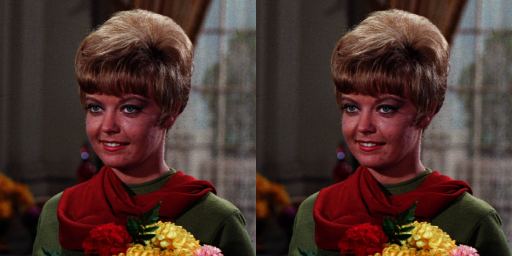

In [3]:
#Nomer 2
original = cv.imread(image_path)
gamma_image = np.zeros(original.shape, original.dtype)

print('Simulasi Image Depth')
print('--------------------')
try:
  bd = float(input('Masukkan nilai bit depth : '))
except ValueError:
  print('Error, not a number')

bit = 2**bd
level = 255 / (bit - 1)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
     gamma_image[y,x,c] = np.clip(round(original[y,x,c] / level) * level, 0, 255);

final_frame = cv.hconcat((original, gamma_image))
cv2_imshow(final_frame)

Nilai PSNR adalah 27.543627929542996 (dB)


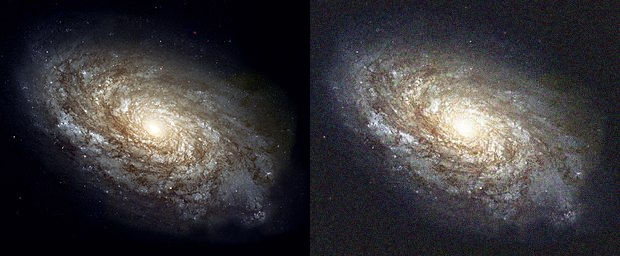

In [5]:
#Nomer 3
import glob
from math import log10, sqrt

original = cv.imread('/content/drive/MyDrive/PCVK/Images/galaxy.jpg')
cv_img = []
for img in glob.glob('/content/drive/MyDrive/PCVK/Images/Noise/*.jpg'):
    n = cv.imread(img)
    cv_img.append(n)

# Jumlah Citra Average 5 :
dst = cv_img[0]
noise_number = 4 # nomor (array) gambar pada folder noises
for i in range(noise_number):
    if i == 0:
        pass
    else:
        alpha = 1.0 / (i + 1)
        beta = 1.0 - alpha
        dst = cv.addWeighted(cv_img[i], alpha, dst, beta, 0.0)

def PSNR(original, compressed):
    mse = np.mean((original - compressed) ** 2)
    if(mse == 0):  # MSE is zero means no noise is present in the signal.
                  # Therefore PSNR have no importance.
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

compressed = dst
psnr = PSNR(original, compressed)

print('Nilai PSNR adalah',psnr,'(dB)')
galaxy_frame = cv.hconcat((original, dst))
cv2_imshow(galaxy_frame)

Nilai PSNR adalah 27.51525142783615 (dB)


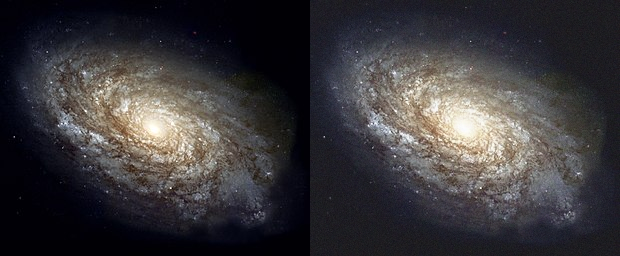

In [6]:
# Jumlah Citra Average 30 :
dst = cv_img[0]
noise_number = 29 # nomor (array) gambar pada folder noises
for i in range(noise_number):
    if i == 0:
        pass
    else:
        alpha = 1.0 / (i + 1)
        beta = 1.0 - alpha
        dst = cv.addWeighted(cv_img[i], alpha, dst, beta, 0.0)

compressed = dst
psnr = PSNR(original, compressed)

print('Nilai PSNR adalah',psnr,'(dB)')
galaxy_frame = cv.hconcat((original, dst))
cv2_imshow(galaxy_frame)

Nilai PSNR adalah 27.489612145135904 (dB)


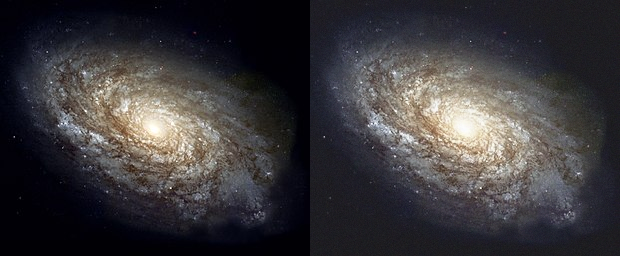

In [7]:
# Jumlah Citra Average 60 :
dst = cv_img[0]
noise_number = 59 # nomor (array) gambar pada folder noises
for i in range(noise_number):
    if i == 0:
        pass
    else:
        alpha = 1.0 / (i + 1)
        beta = 1.0 - alpha
        dst = cv.addWeighted(cv_img[i], alpha, dst, beta, 0.0)

compressed = dst
psnr = PSNR(original, compressed)

print('Nilai PSNR adalah',psnr,'(dB)')
galaxy_frame = cv.hconcat((original, dst))
cv2_imshow(galaxy_frame)

Nilai PSNR adalah 27.507521107508772 (dB)


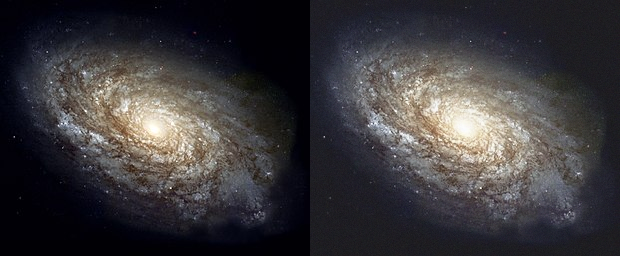

In [8]:
# Jumlah Citra Average 80 :
dst = cv_img[0]
noise_number = 79 # nomor (array) gambar pada folder noises
for i in range(noise_number):
    if i == 0:
        pass
    else:
        alpha = 1.0 / (i + 1)
        beta = 1.0 - alpha
        dst = cv.addWeighted(cv_img[i], alpha, dst, beta, 0.0)

compressed = dst
psnr = PSNR(original, compressed)

print('Nilai PSNR adalah',psnr,'(dB)')
galaxy_frame = cv.hconcat((original, dst))
cv2_imshow(galaxy_frame)

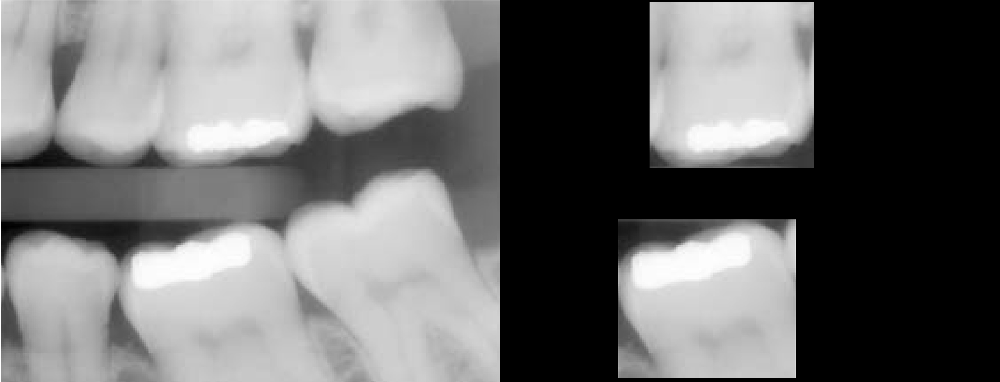

In [9]:
#Nomer 4
img = cv.imread('/content/drive/MyDrive/PCVK/Images/teeth.jpg')
mask = np.zeros(img.shape, dtype=np.uint8)
mask = cv.rectangle(mask,pt1=(320,595),pt2=(800,1025),color=(255,255,255),thickness=-1)

result = img & mask

mask1 = cv.rectangle(mask,pt1=(405,5),pt2=(850,455),color=(255,255,255),thickness=-1)

result = img & mask1

final_frame = cv.hconcat((img, result))
cv2_imshow(final_frame)

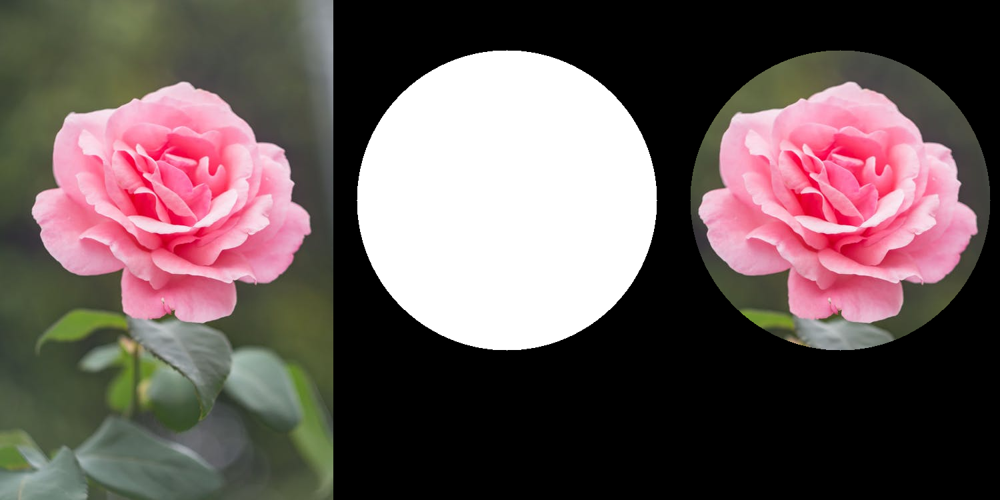

In [10]:
#Nomer 5
#Operator AND
img_rose = cv.imread('/content/drive/MyDrive/PCVK/Images/rose_pink.png')

mask = np.zeros(img_rose.shape, dtype=np.uint8)
mask = cv.circle(mask, (260, 300), 225, (255,255,255), -1)

masked = img_rose & mask

rose_frame = cv.hconcat((img_rose, mask, masked))
cv2_imshow(rose_frame)

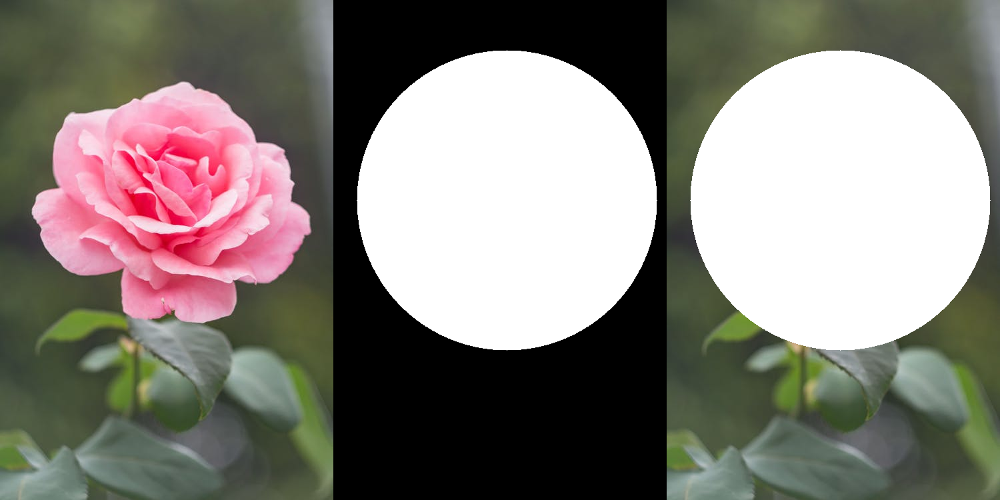

In [11]:
#Operator OR
mask = np.zeros(img_rose.shape, dtype=np.uint8)
mask = cv.circle(mask, (260, 300), 225, (255,255,255), -1)

masked = img_rose | mask

rose_frame = cv.hconcat((img_rose, mask, masked))
cv2_imshow(rose_frame)

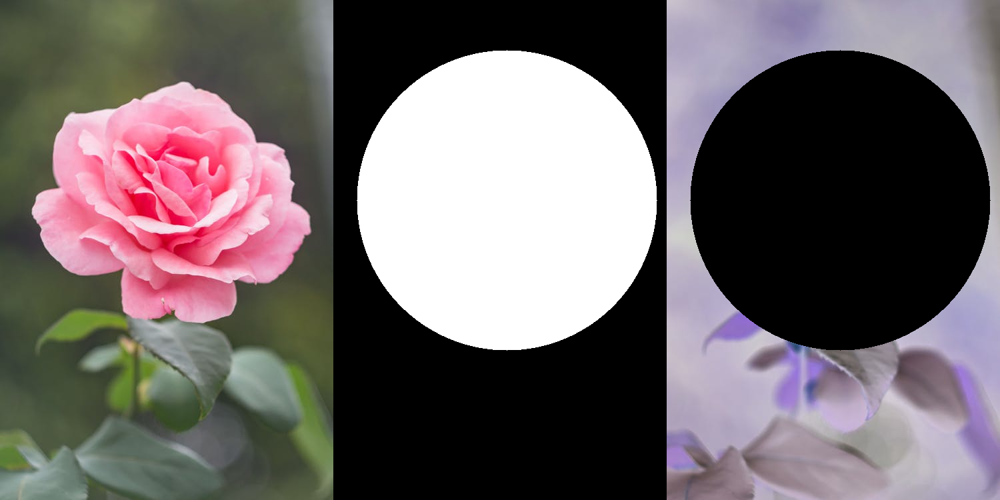

In [12]:
#Operator NOT
mask = np.zeros(img_rose.shape, dtype=np.uint8)
mask = cv.circle(mask, (260, 300), 225, (255,255,255), -1)

masked = ~img_rose & ~mask

rose_frame = cv.hconcat((img_rose, mask, masked))
cv2_imshow(rose_frame)

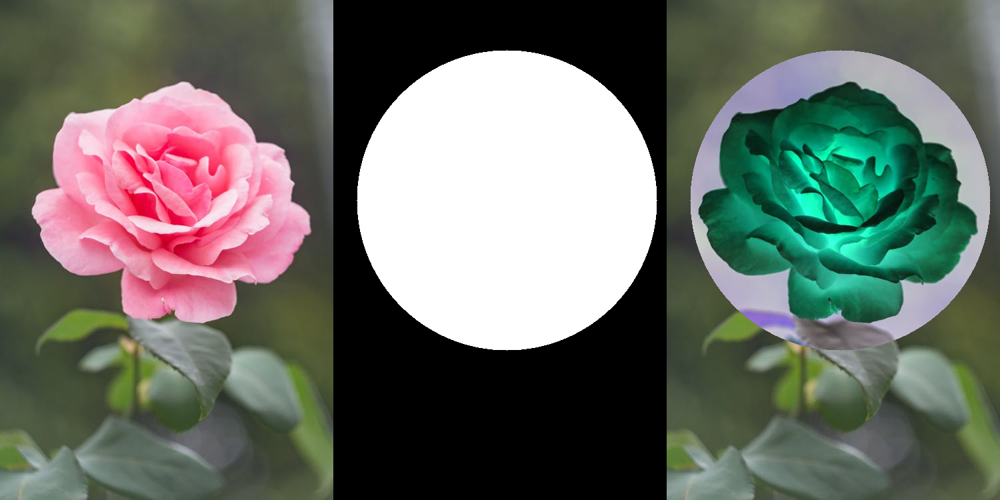

In [13]:
#Operator XOR
mask = np.zeros(img_rose.shape, dtype=np.uint8)
mask = cv.circle(mask, (260, 300), 225, (255,255,255), -1)

masked = img_rose ^ mask

rose_frame = cv.hconcat((img_rose, mask, masked))
cv2_imshow(rose_frame)

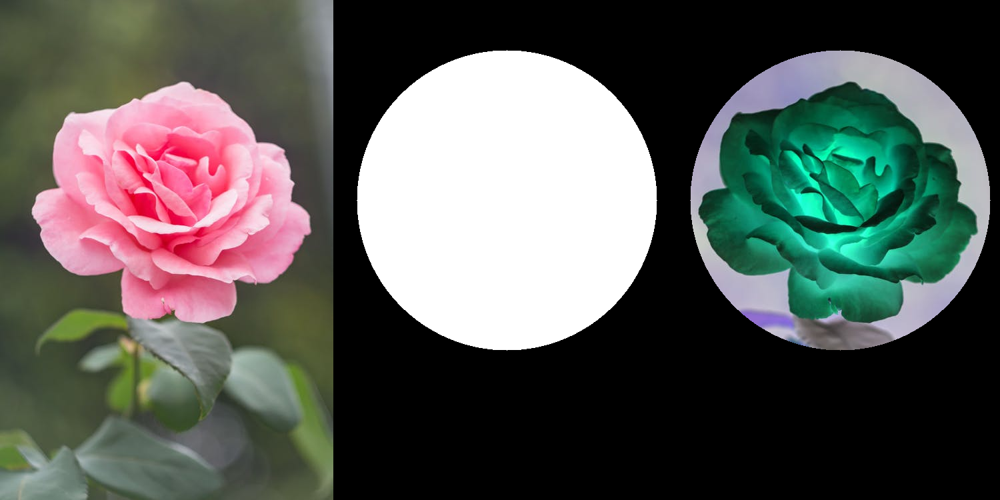

In [14]:
#Operator NAND atau NOT AND
mask = np.zeros(img_rose.shape, dtype=np.uint8)
mask = cv.circle(mask, (260, 300), 225, (255,255,255), -1)

masked = ~img_rose & mask

rose_frame = cv.hconcat((img_rose, mask, masked))
cv2_imshow(rose_frame)

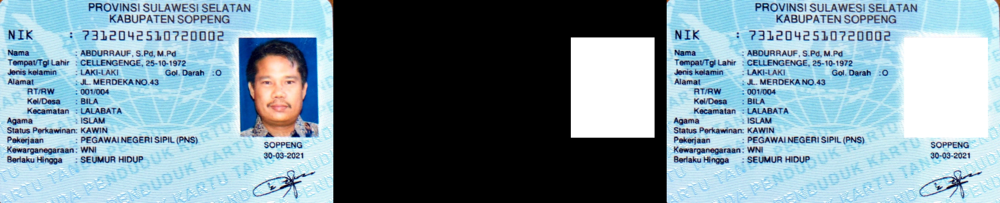

In [35]:
ktp_path = '/content/drive/MyDrive/Praktek/KTP.jpeg'

ktp = cv.imread(ktp_path)
mask = np.zeros(ktp.shape, dtype=np.uint8)
mask = cv.rectangle(mask,pt1=(570,90),pt2=(770,330),color=(255,255,255),thickness=-1)

result = ktp | mask

final_frame = cv.hconcat((ktp, mask, result))
cv2_imshow(final_frame)

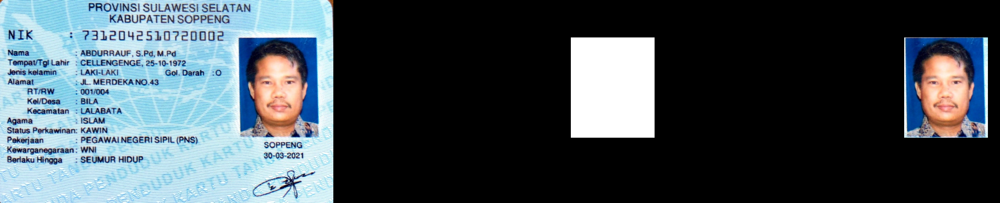

In [36]:
result = ktp & mask

final_frame = cv.hconcat((ktp, mask, result))
cv2_imshow(final_frame)

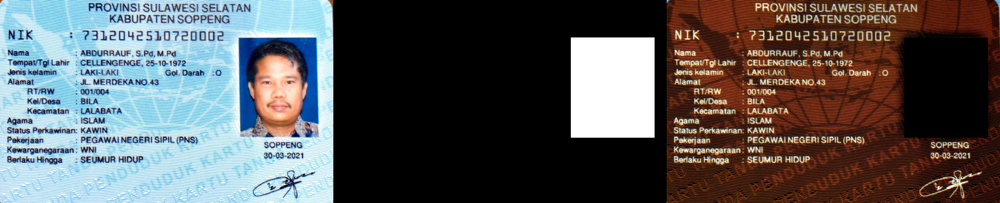

In [42]:
result = ~ktp & ~mask

final_frame = cv.hconcat((ktp, mask, result))
cv2_imshow(final_frame)

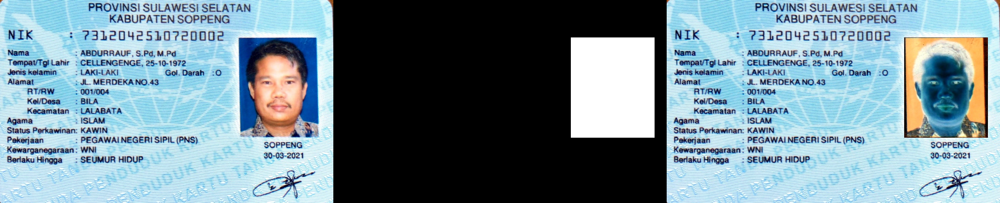

In [41]:
result = ktp ^ mask

final_frame = cv.hconcat((ktp, mask, result))
cv2_imshow(final_frame)

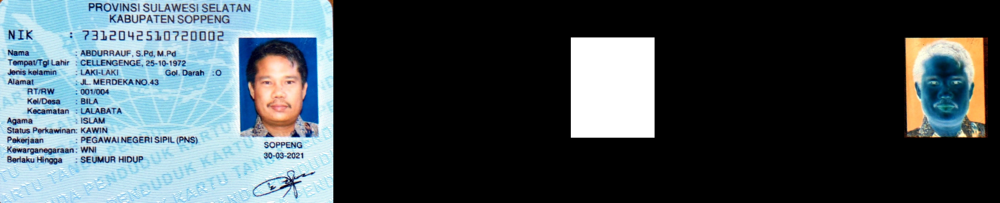

In [43]:
result = ~ktp & mask

final_frame = cv.hconcat((ktp, mask, result))
cv2_imshow(final_frame)